In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from pathlib import Path
import scanpy as sc
import anndata as ad
import skimage as skimage

In [2]:
PROJECT_ROOT = Path.cwd().resolve().parent
input_file = (
    PROJECT_ROOT
    / "data"
    / "raw"
    / "bbn963sq6_filtered_feature_bc_matrix.h5"
)

if not input_file.exists():
    raise FileNotFoundError(f"Input file not found: {input_file}")

output_dir = PROJECT_ROOT / "data" / "processed"
output_dir.mkdir(parents=True, exist_ok=True)

UMAP_STYLE = {
    "legend_loc": "on data",
    "legend_fontsize": 9,
    "legend_fontweight": "semibold",
    "legend_fontoutline": 2,
    "size": 20,
    "alpha": 0.85,
    "marker": "o",
    "add_outline": True,
    "outline_width": (0.2, 0.03),
    "palette": "Set1",
    "ncols": 2,
    "wspace": 0.3,
}

In [3]:
adata_preprocessing = sc.read_10x_h5(input_file)
adata_preprocessing.var_names_make_unique()
adata_preprocessing.obs_names_make_unique()
adata_preprocessing.obs["sample"] = "BBN963sq6"

/Users/timothy/miniconda3/envs/python-311/lib/python3.11/site-packages/anndata/_core/anndata.py:1884: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/Users/timothy/miniconda3/envs/python-311/lib/python3.11/site-packages/anndata/_core/anndata.py:1884: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [4]:
adata_preprocessing.shape

(5431, 33696)

Preprocessing

In [5]:
# mitochondrial genes, "MT-" for human, "Mt-" for mouse
adata_preprocessing.var["mt"] = adata_preprocessing.var_names.str.startswith("mt-")
adata_preprocessing.var["ribo"] = adata_preprocessing.var_names.str.startswith(("Rps", "Rpl"))
adata_preprocessing.var["hb"] = adata_preprocessing.var_names.str.contains(r"^Hb[ab]", regex=True)

sc.pp.calculate_qc_metrics(adata_preprocessing, qc_vars=["mt", "ribo", "hb"], inplace=True, log1p=True)

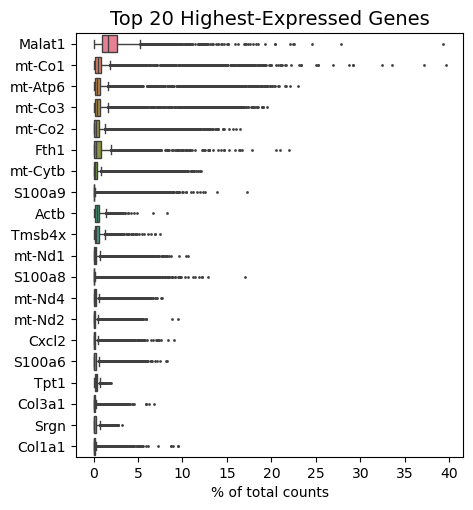

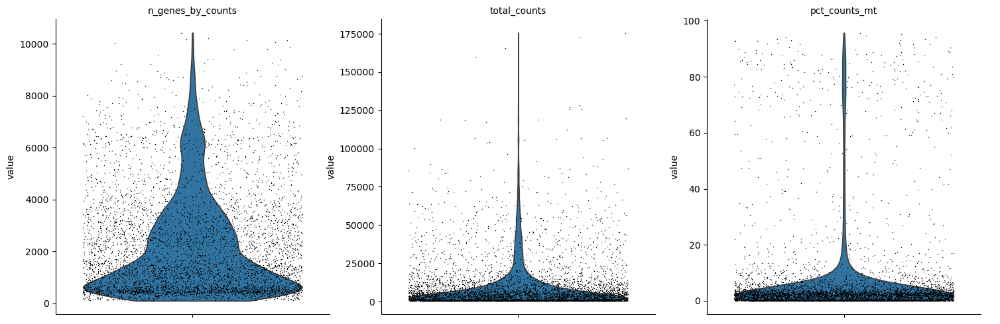

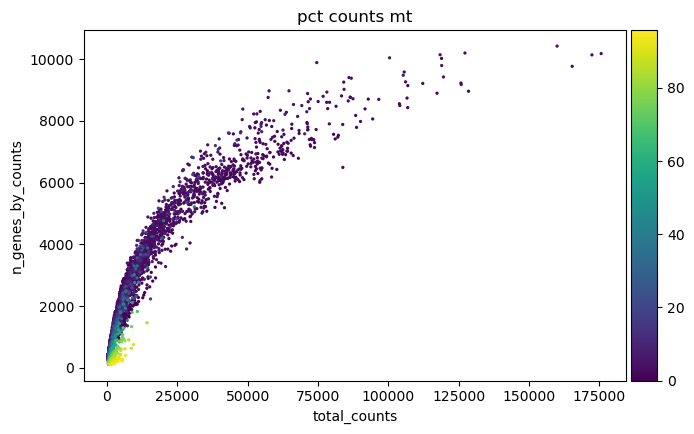

In [6]:
ax = sc.pl.highest_expr_genes(adata_preprocessing, n_top=20, show=False)
ax.set_title("Top 20 Highest-Expressed Genes", fontsize=14)

# Genes by counts
# Total Counts
# % Mitochondria
sc.pl.violin(
    adata_preprocessing,
    ["n_genes_by_counts", "total_counts", "pct_counts_mt"],
    jitter=0.4,
    multi_panel=True,
)

# 
sc.pl.scatter(adata_preprocessing, "total_counts", "n_genes_by_counts", color="pct_counts_mt")

In [26]:
sc.pp.filter_cells(adata_preprocessing, min_genes=100) # filter out cells with fewer than 100 genes expressed
sc.pp.filter_genes(adata_preprocessing, min_cells=3) # filter out genes that are expressed in fewer than 3 cells
sc.pp.scrublet(adata_preprocessing) # scrublet to identify doublets
print(np.median(adata_preprocessing.obs["doublet_score"])) # print median doublet scores

adata_preprocessing = adata_preprocessing[adata_preprocessing.obs["doublet_score"] < 0.25] # filter out cells with high doublet scores
adata_preprocessing = adata_preprocessing[adata_preprocessing.obs["pct_counts_mt"] < 10].copy() # filter out cells with high mt gene expression (revisit, may be real biology)

0.032093734080489045


In [27]:
adata_preprocessing.shape

(4837, 22886)

Normalization

In [28]:
# Saving count data
adata_preprocessing.layers["counts"] = adata_preprocessing.X.copy()
# Normalizing to median total counts
sc.pp.normalize_total(adata_preprocessing)
# Logarithmize the data
sc.pp.log1p(adata_preprocessing)

In [29]:
from sklearn.mixture import GaussianMixture
from sklearn.metrics import adjusted_rand_score, jaccard_score


# ---------------------------
# Configuration
# ---------------------------

HVG_VALUES = [1000, 2000, 3000, 5000]
FINAL_N_HVG = 2000

N_PCS = 50
N_NEIGHBORS = 15
LEIDEN_RESOLUTION = 0.5
RANDOM_STATE = 0


leukocyte_markers = {
    "Leukocytes": [
        "Ptprc",
        "Cd52",
        "Coro1a",
        "Lcp1",
        "Ptpn6",
        "Rac2",
        "Hcls1",
    ]
}

In [30]:
# Select leukocyte genes
leukocyte_genes = []
for gene in leukocyte_markers["Leukocytes"]: 
    if gene in adata_preprocessing.var_names:
        leukocyte_genes.append(gene)

# check if enough leukocyte genes were found in the dataset
if len(leukocyte_genes) < 3:
    raise ValueError(
        f"Only {len(leukocyte_genes)} leukocyte markers were found: "
        f"{leukocyte_genes}"
    )

print(
    f"Using {len(leukocyte_genes)} leukocyte markers:",
    leukocyte_genes,
)

# calculates a leukocyte marker-expression score for every cell
# basically like:
# leukocyte score = average expression of leukocyte marker genes − average expression of matched control genes
sc.tl.score_genes(
    adata_preprocessing,
    gene_list=leukocyte_genes,
    score_name="leukocyte_score",
    use_raw=False,
    random_state=RANDOM_STATE,
)

Using 7 leukocyte markers: ['Ptprc', 'Cd52', 'Coro1a', 'Lcp1', 'Ptpn6', 'Rac2', 'Hcls1']


GMM component means: [ 0.61635409 -0.25590187]
leukocyte_reference
Leukocyte        0.527806
Non-leukocyte    0.472194
Name: proportion, dtype: float64


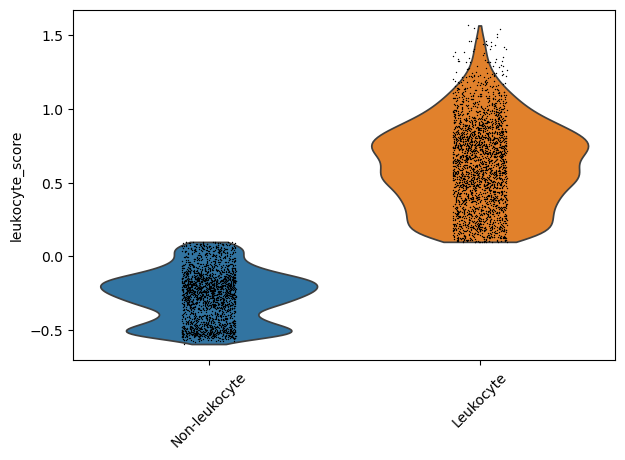

In [31]:
scores = (
    adata_preprocessing.obs["leukocyte_score"]
    .to_numpy()
    .reshape(-1, 1)
)

gmm = GaussianMixture(
    n_components=2,
    random_state=RANDOM_STATE,
).fit(scores)

components = gmm.predict(scores)

# The component with the higher score is called leukocytic
leukocyte_component = np.argmax(gmm.means_.ravel())

reference_bool = components == leukocyte_component

# Keep a Boolean column for calculations
adata_preprocessing.obs["leukocyte_reference_bool"] = reference_bool

# Keep a separate categorical column for plotting
adata_preprocessing.obs["leukocyte_reference"] = pd.Categorical(
    np.where(
        reference_bool,
        "Leukocyte",
        "Non-leukocyte",
    ),
    categories=["Non-leukocyte", "Leukocyte"],
)

print("GMM component means:", gmm.means_.ravel())

print(
    adata_preprocessing.obs["leukocyte_reference"]
    .value_counts(normalize=True)
)

sc.pl.violin(
    adata_preprocessing,
    keys="leukocyte_score",
    groupby="leukocyte_reference",
    rotation=45,
)

In [32]:
binary_assignments = {}
hvg_results = []

for n_hvg in HVG_VALUES:
    print(f"Testing {n_hvg} HVGs")

    ad_test = adata_preprocessing.copy()

    # Select HVGs without removing other genes
    sc.pp.highly_variable_genes(
        ad_test,
        flavor="seurat",
        n_top_genes=n_hvg,
        subset=False,
    )

    sc.pp.pca(
        ad_test,
        n_comps=50,
        mask_var="highly_variable",
        random_state=RANDOM_STATE,
    )

    sc.pp.neighbors(
        ad_test,
        n_neighbors=N_NEIGHBORS,
        n_pcs=N_PCS,
        random_state=RANDOM_STATE,
    )

    cluster_key = f"leiden_{n_hvg}"

    sc.tl.leiden(
        ad_test,
        resolution=LEIDEN_RESOLUTION,
        key_added=cluster_key,
        random_state=RANDOM_STATE,
    )

    reference = (
        ad_test.obs["leukocyte_reference_bool"]
        .astype(bool)
    )

    clusters = ad_test.obs[cluster_key].astype(str)

    # Fraction of reference leukocytes in each cluster
    leukocyte_fraction = reference.groupby(clusters).mean()

    # Call a cluster leukocytic when at least half its cells
    # are reference leukocytes
    predicted = (
        clusters.map(leukocyte_fraction.ge(0.5))
        .astype(bool)
    )

    binary_assignments[n_hvg] = predicted.copy()

    mixed_clusters = (
        leukocyte_fraction.between(
            0.20,
            0.80,
            inclusive="neither",
        )
    ).sum()

    hvg_results.append({
        "n_hvg": n_hvg,
        "n_clusters": clusters.nunique(),
        "jaccard_vs_reference": jaccard_score(
            reference,
            predicted,
        ),
        "ari_vs_reference": adjusted_rand_score(
            reference,
            predicted,
        ),
        "discordant_fraction": np.mean(
            reference.to_numpy() != predicted.to_numpy()
        ),
        "mixed_clusters": mixed_clusters,
    })


hvg_results = pd.DataFrame(hvg_results)

hvg_results

Testing 1000 HVGs


/var/folders/gg/932gdyqn2_q_br7zccl_28y80000gn/T/ipykernel_4734/1325651582.py:33: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(


Testing 2000 HVGs
Testing 3000 HVGs
Testing 5000 HVGs


,n_hvg,n_clusters,jaccard_vs_reference,ari_vs_reference,discordant_fraction,mixed_clusters
0,1000,14,0.840594,0.647651,0.097581,1
1,2000,14,0.854833,0.681376,0.087244,1
2,3000,14,0.853558,0.678647,0.088071,1
3,5000,17,0.852830,0.676603,0.088691,3


In [33]:
# Select the final HVG set
sc.pp.highly_variable_genes(
    adata_preprocessing,
    flavor="seurat",
    n_top_genes=FINAL_N_HVG,
    subset=False,
)

# PCA using only the selected HVGs
sc.pp.pca(
    adata_preprocessing,
    n_comps=50,
    mask_var="highly_variable",
    random_state=RANDOM_STATE,
)

# Neighbor graph
sc.pp.neighbors(
    adata_preprocessing,
    n_neighbors=N_NEIGHBORS,
    n_pcs=N_PCS,
    random_state=RANDOM_STATE,
)

# UMAP
sc.tl.umap(
    adata_preprocessing,
    random_state=RANDOM_STATE,
)

# Final Leiden clustering
sc.tl.leiden(
    adata_preprocessing,
    resolution=LEIDEN_RESOLUTION,
    key_added="leiden",
    random_state=RANDOM_STATE,
)

In [34]:
reference = (
    adata_preprocessing.obs["leukocyte_reference_bool"]
    .astype(bool)
)

clusters = adata_preprocessing.obs["leiden"].astype(str)

cluster_leukocyte_fraction = reference.groupby(clusters).mean()

cluster_prediction_bool = (
    clusters.map(cluster_leukocyte_fraction.ge(0.5))
    .astype(bool)
)

adata_preprocessing.obs["leukocyte_cluster_call"] = pd.Categorical(
    np.where(
        cluster_prediction_bool,
        "Leukocyte",
        "Non-leukocyte",
    ),
    categories=["Non-leukocyte", "Leukocyte"],
)

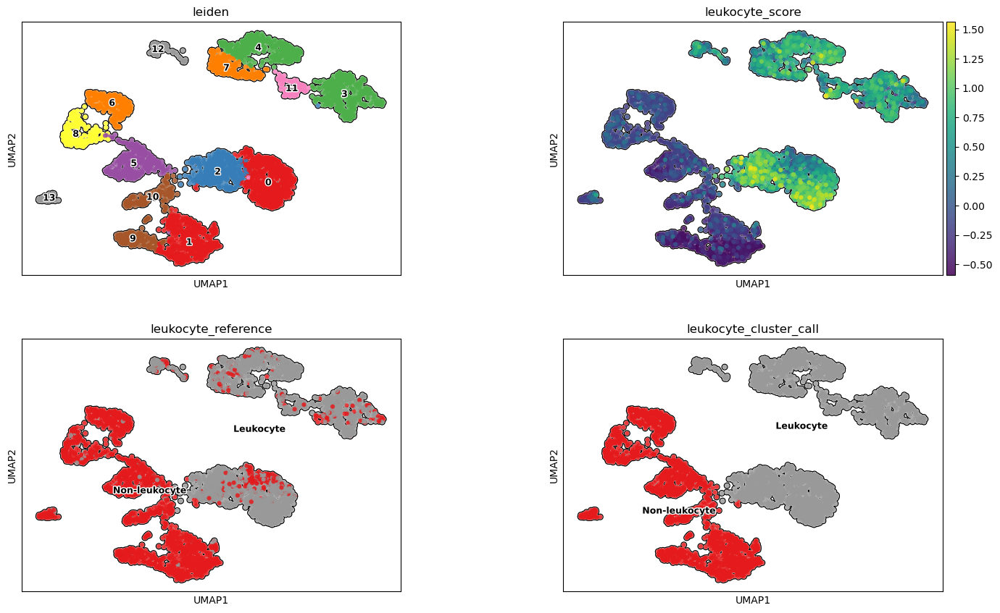

In [35]:
sc.pl.umap(
    adata_preprocessing,
    color=[
        "leiden",
        "leukocyte_score",
        "leukocyte_reference",
        "leukocyte_cluster_call",
    ],
    **UMAP_STYLE
)

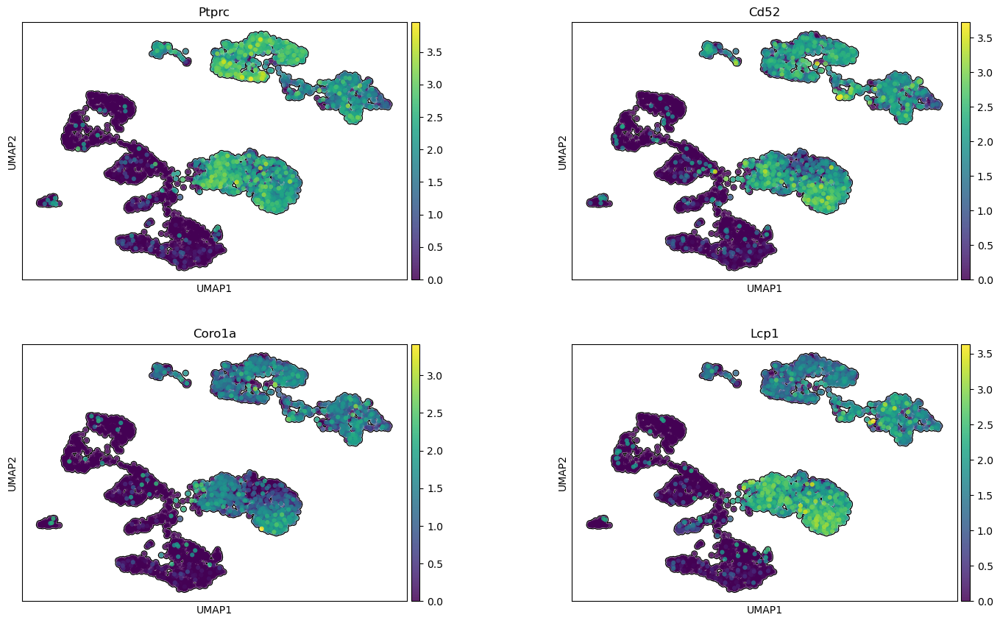

In [36]:
genes_to_plot = [
    gene
    for gene in ["Ptprc", "Cd52", "Coro1a", "Lcp1"]
    if gene in adata_preprocessing.var_names
]

sc.pl.umap(
    adata_preprocessing,
    color=genes_to_plot,
    cmap="viridis",
    **UMAP_STYLE
)

In [37]:
cluster_summary = (
    adata_preprocessing.obs
    .assign(
        reference_leukocyte=reference,
        cluster_leukocyte=cluster_prediction_bool,
        discordant=reference != cluster_prediction_bool,
    )
    .groupby("leiden", observed=True)
    .agg(
        n_cells=("discordant", "size"),
        leukocyte_fraction=("reference_leukocyte", "mean"),
        discordant_fraction=("discordant", "mean"),
        mean_leukocyte_score=("leukocyte_score", "mean"),
    )
    .sort_values(
        "leukocyte_fraction",
        ascending=False,
    )
)

cluster_summary

,n_cells,leukocyte_fraction,discordant_fraction,mean_leukocyte_score
leiden,,,,
2,608,0.921053,0.078947,0.654153
4,475,0.917895,0.082105,0.589620
11,105,0.914286,0.085714,0.551960
3,545,0.888073,0.111927,0.468634
7,258,0.864341,0.135659,0.461262
0,746,0.815013,0.184987,0.548473
12,102,0.764706,0.235294,0.318981
13,74,0.094595,0.094595,-0.184525
8,241,0.087137,0.087137,-0.124095


In [38]:
adata_preprocessing.write_h5ad(output_dir / "bbn963sq6_processed_unlabeled.h5ad")

In [39]:
adata_preprocessing

AnnData object with n_obs × n_vars = 4837 × 22886
    obs: 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'n_genes', 'doublet_score', 'predicted_doublet', 'leukocyte_score', 'leukocyte_reference_bool', 'leukocyte_reference', 'leiden', 'leukocyte_cluster_call'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'scrublet', 'log1p', 'leukocyte_reference_colors', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_color

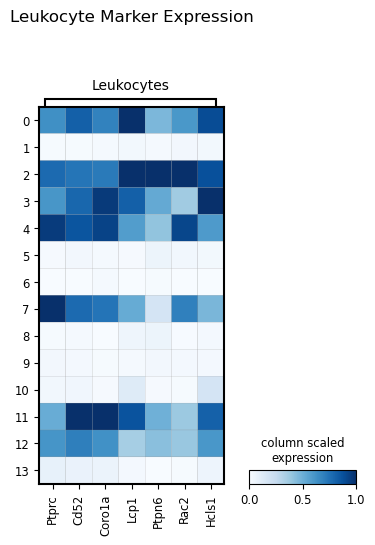

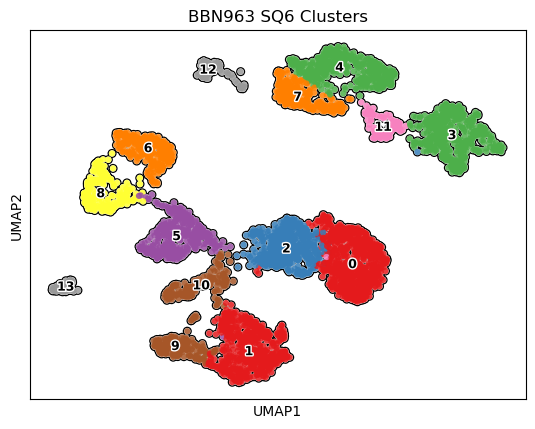

In [40]:
mp = sc.pl.matrixplot(
    adata_preprocessing,
    leukocyte_markers,
    "leiden",
    dendrogram=False,
    cmap="Blues",
    standard_scale="var",
    colorbar_title="column scaled\nexpression",
    title="Leukocyte Marker Expression",
    var_group_rotation=0,
    return_fig=True,
)

mp.savefig(
    output_dir / "BBN963_SQ6_leukocyte_matrixplot.png",
    dpi=600,
    bbox_inches="tight",
)

umap_plot = sc.pl.umap(
    adata_preprocessing,
    color="leiden",
    title="BBN963 SQ6 Clusters",
    return_fig=True,
    show=False,
    **UMAP_STYLE,
)

umap_plot.savefig(
    output_dir / "BBN963_SQ6_leiden_umap.png",
    dpi=600,
    bbox_inches="tight",
)

DEGs as Markers
- using leiden res = 0.50 gives cleanest clusters

Leiden res = 0.02

In [ ]:
cluster_4_markers = {
    "tumor_epithelial": [
        "Epcam", "Krt5", "Krt6a", "Krt14",
        "Krt17", "Cd44", "Cdh3", "Cldn4"
    ],

    "myeloid_immune": [
        "Lyz2", "Aif1", "Csf1r", "Adgre1",
        "C1qa", "C1qb", "C1qc", "Tyrobp",
        "Fcgr3", "Trem2"
    ],

    "lymphoid_immune": [
        "Cd3d", "Cd3e", "Trac", "Lck",
        "Cd2", "Nkg7", "Prf1", "Gzmb",
        "Ms4a1", "Cd79a"
    ],

    "stromal_vascular": [
        "Col1a1", "Col1a2", "Dcn", "Lum",
        "Pdgfra", "Acta2", "Rgs5",
        "Pecam1", "Cdh5", "Kdr"
    ],
}

TUMOR_EPITHELIAL:


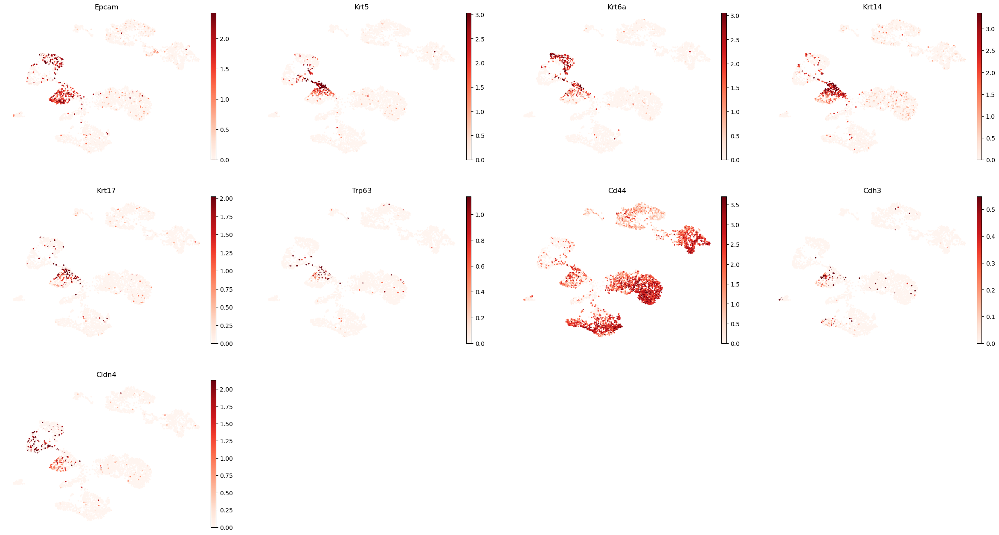





MYELOID_IMMUNE:


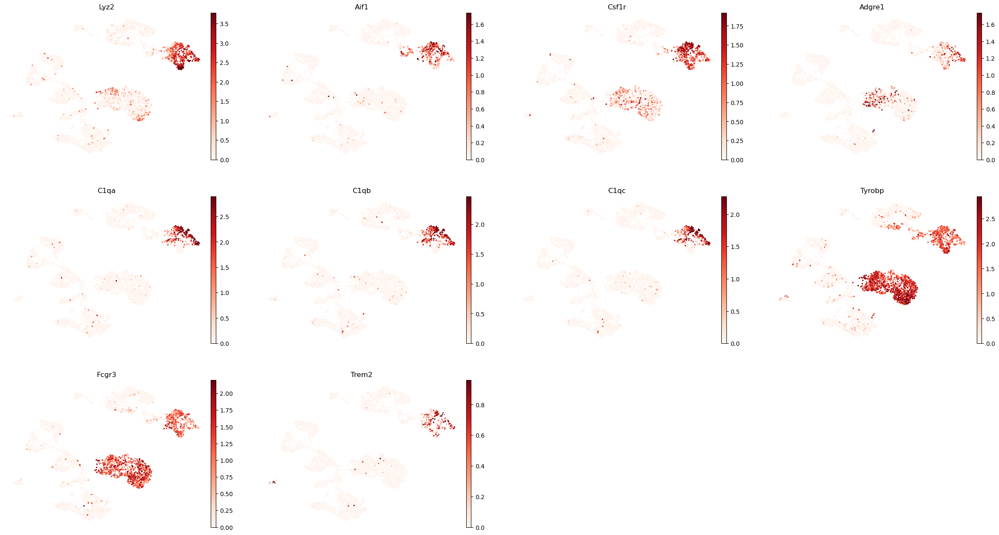





LYMPHOID_IMMUNE:


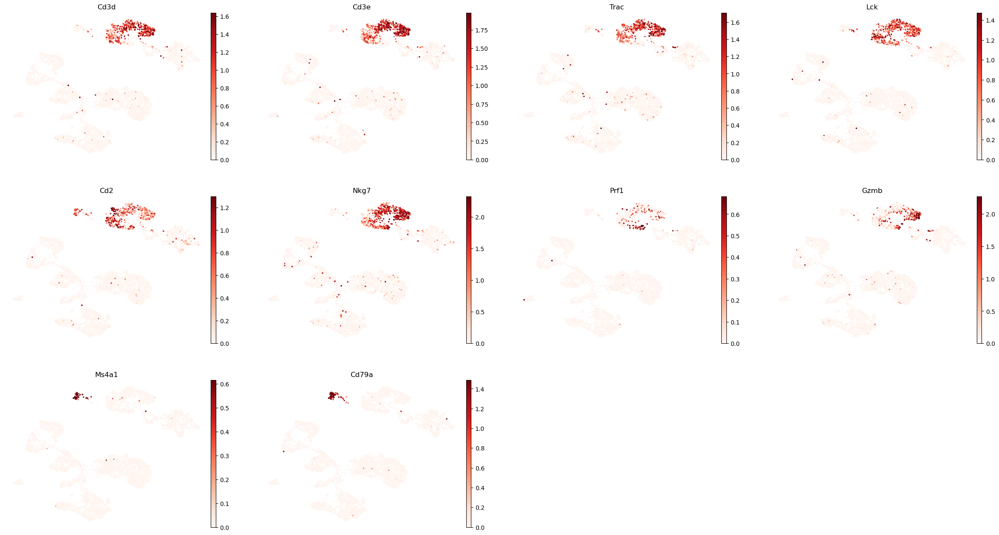





STROMAL_VASCULAR:


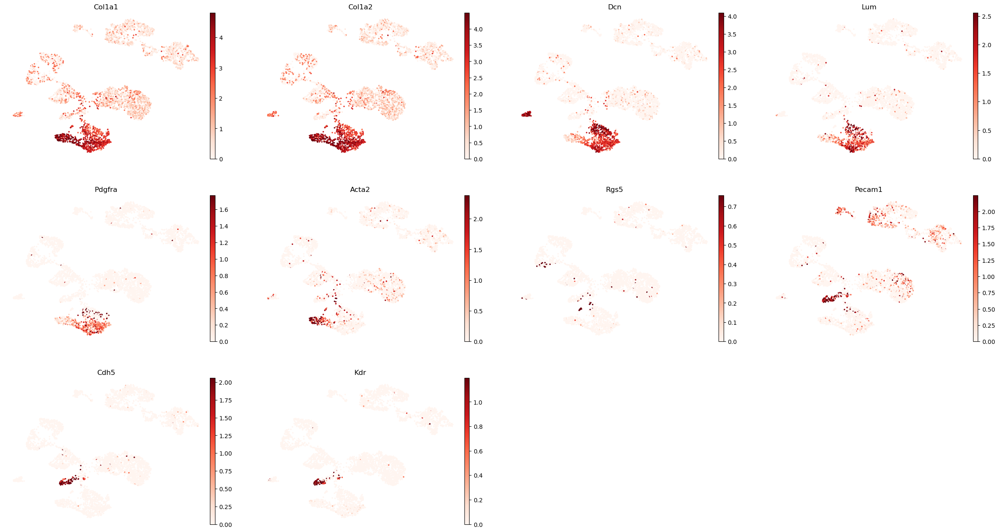

In [42]:
for ct, markers in cluster_4_markers.items():
    markers_found = []
    for marker in markers:
        if marker in adata.var.index:
            markers_found.append(marker)
    cluster_4_markers[ct] = markers_found

cluster_4_names = list(cluster_4_markers.keys())
for ct in cluster_4_names:
    print(f"{ct.upper()}:")  # print cell subtype name
    sc.pl.umap(
        adata,
        color=cluster_4_markers[ct],
        vmin=0,
        vmax="p99",  # set vmax to the 99th percentile of the gene count instead of the maximum, to prevent outliers from making expression in other cells invisible. Note that this can cause problems for extremely lowly expressed genes.
        sort_order=False,  # do not plot highest expression on top, to not get a biased view of the mean expression among cells
        frameon=False,
        cmap="Reds",  # or choose another color map e.g. from here: https://matplotlib.org/stable/tutorials/colors/colormaps.html
    )
    print("\n\n\n")  # print white space for legibility

In [ ]:
# Annotated cell types based on marker genes
adata.obs["cell_type_lvl1"] = adata.obs["leiden_res_0.02"].map(
    {
        "0": "stromal_vascular",
        "1": "tumor_epithelial",
        "2": "lymphoid_immune",
        "3": "myeloid_immune"
    }
)
adata.obs["cell_type_lvl1"] = adata.obs["cell_type_lvl1"].astype("category")

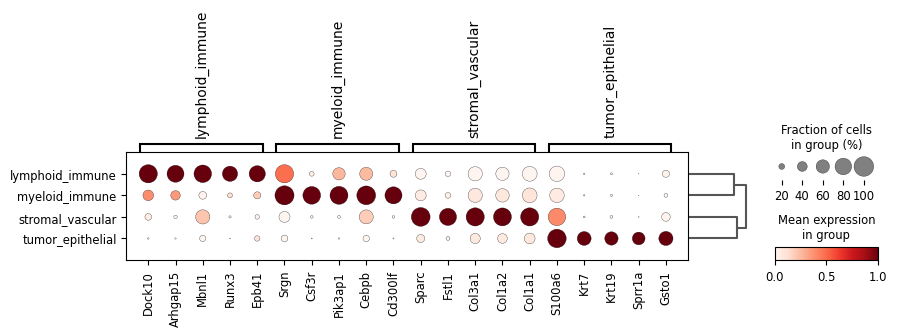

In [ ]:
# Obtain cluster-specific differentially expressed genes
sc.tl.rank_genes_groups(adata, groupby="cell_type_lvl1", method="wilcoxon")
sc.pl.rank_genes_groups_dotplot(adata, groupby="cell_type_lvl1", standard_scale="var", n_genes=5)

In [ ]:
adata

AnnData object with n_obs × n_vars = 4837 × 22886
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'n_genes', 'doublet_score', 'predicted_doublet', 'leiden', 'leiden_res_0.02', 'leiden_res_0.20', 'leiden_res_0.50', 'cell_type_lvl1'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'scrublet', 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors', 'leiden_res_0.02', 'leiden_res_0.20', 'leiden_res_0.50', 

In [ ]:
sc.get.rank_genes_groups_df(
    adata,
    group="lymphoid_immune"
).head(5)

,names,scores,logfoldchanges,pvals,pvals_adj
0,Dock10,41.960941,3.724856,0.000000e+00,0.000000e+00
1,Arhgap15,38.423553,3.719394,0.000000e+00,0.000000e+00
2,Mbnl1,37.788925,3.133897,0.000000e+00,0.000000e+00
3,Runx3,36.661369,4.423498,3.015287e-294,1.725196e-290
4,Epb41,36.489063,3.652717,1.653374e-291,7.567824e-288


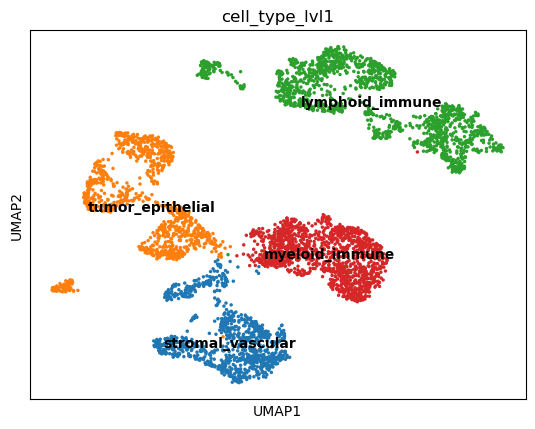

In [ ]:
sc.pl.umap(
    adata,
    color=["cell_type_lvl1"],
    legend_loc="on data")

leiden_res = 0.20

In [ ]:
# Obtain cluster-specific differentially expressed genes
sc.tl.rank_genes_groups(adata, groupby="leiden_res_0.20", method="wilcoxon")

In [ ]:
markers_9_clusters = {
    "tumor_basal_epithelial": [
        "Epcam", "Krt5", "Krt6a", "Krt6b", "Krt14",
        "Krt16", "Krt17", "Trp63", "Cd44", "Cdh3"
    ],

    "tumor_luminal_epithelial": [
        "Epcam", "Krt8", "Krt18", "Krt19", "Krt20",
        "Upk1a", "Upk1b", "Upk2", "Upk3a",
        "Foxa1", "Pparg", "Fgfr3"
    ],

    "cycling_cells": [
        "Mki67", "Top2a", "Cdk1", "Ccnb1", "Ccnb2",
        "Pcna", "Mcm5", "Hmgb2", "Stmn1", "Tuba1b"
    ],

    "macrophages": [
        "Ptprc", "Lyz2", "Adgre1", "Csf1r", "Cd68",
        "C1qa", "C1qb", "C1qc", "Apoe", "Mrc1", "Trem2",
        "Ccr2", "Marco", "Pdl2", "Cd40", "Ccl2", "Csf1", "Cd16"
],

    "monocytes_neutrophils": [
        "Ptprc", "Lyz2", "Ly6c2", "Ccr2", "Plac8",
        "S100a8", "S100a9", "Retnlg", "Lcn2",
        "Mmp8", "Ngp", "Camp", "Cxcr2"
    ],

    "t_nk_cells": [
        "Ptprc", "Cd3d", "Cd3e", "Cd3g", "Trac",
        "Cd4", "Cd8a", "Cd8b1", "Il7r",
        "Nkg7", "Gzmb", "Prf1", "Ccl5", "Klrk1"
    ],

    "b_plasma_cells": [
        "Ptprc", "Ms4a1", "Cd79a", "Cd79b",
        "Cd74", "H2-Aa", "H2-Ab1",
        "Jchain", "Mzb1", "Xbp1", "Sdc1"
    ],

    "fibroblast_pericyte_smooth_muscle": [
        "Col1a1", "Col1a2", "Col3a1", "Dcn", "Lum",
        "Pdgfra", "Thy1", "Fap",
        "Acta2", "Tagln", "Myh11", "Rgs5",
        "Pdgfrb", "Cspg4", "Des"
    ],

    "endothelial_lymphatic": [
        "Pecam1", "Cdh5", "Kdr", "Esam", "Vwf",
        "Plvap", "Eng",
        "Lyve1", "Prox1", "Pdpn", "Flt4", "Ccl21a"
    ]
}

TUMOR_BASAL_EPITHELIAL:


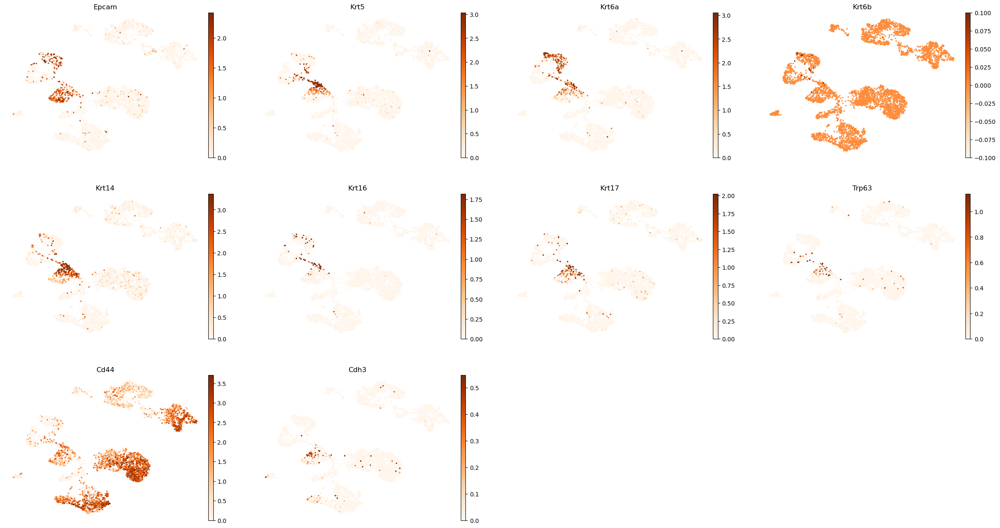





TUMOR_LUMINAL_EPITHELIAL:


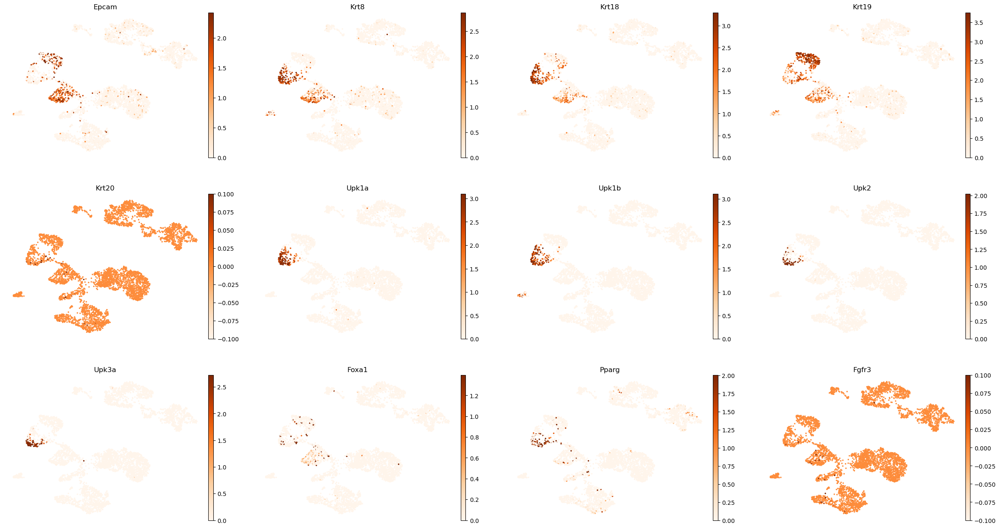





CYCLING_CELLS:


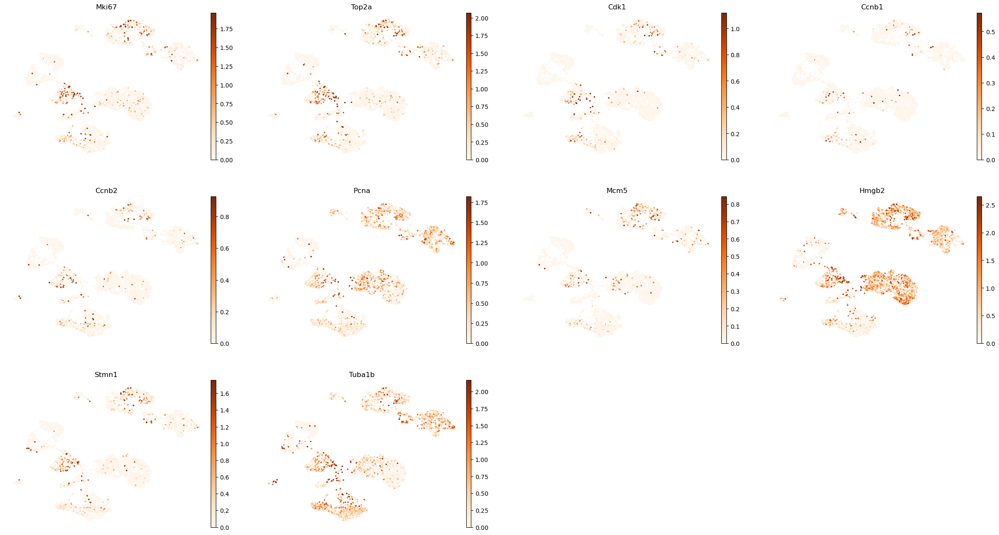





MACROPHAGES:


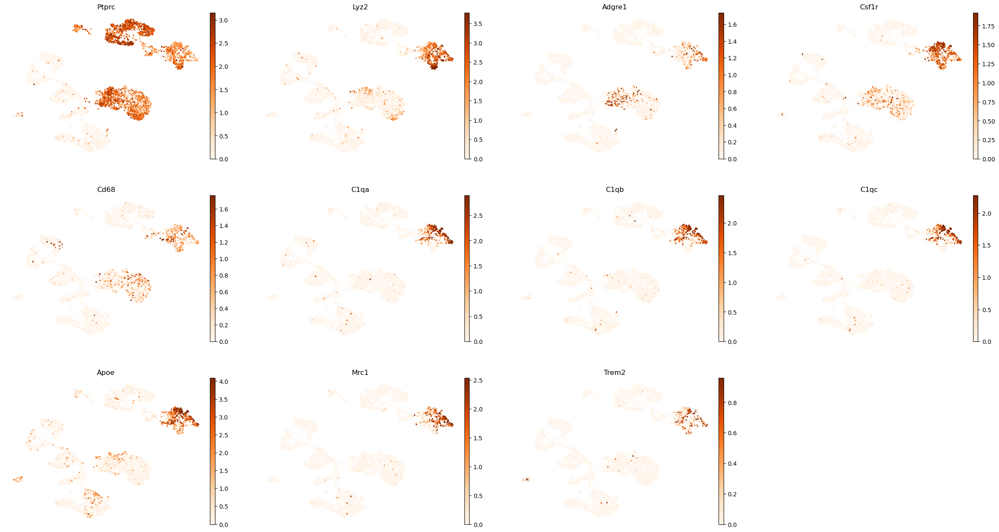





MONOCYTES_NEUTROPHILS:


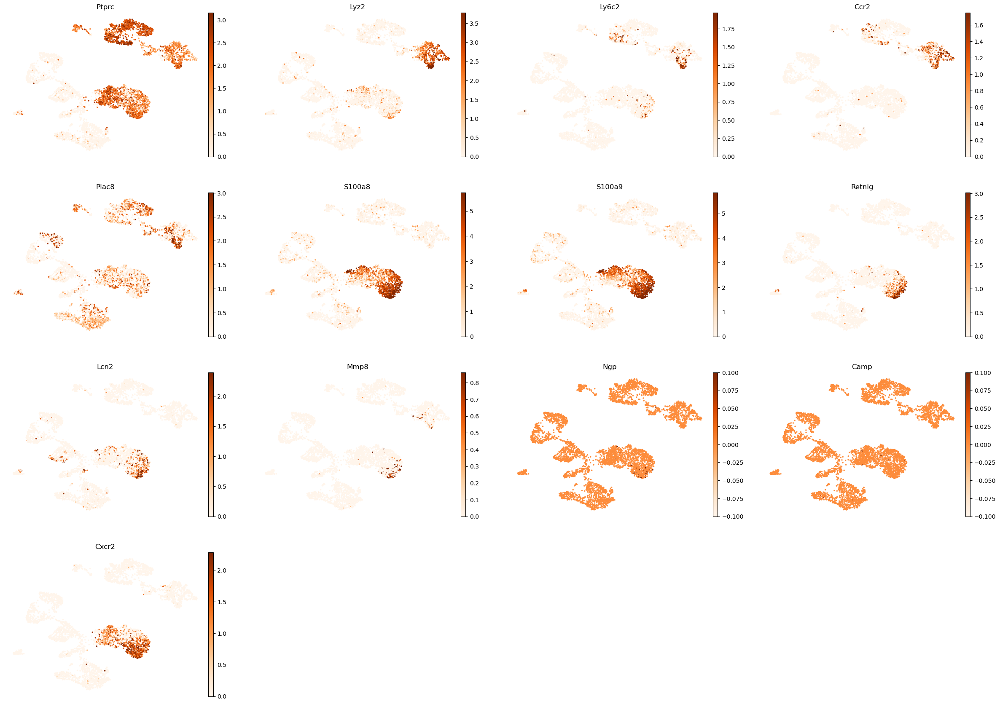





T_NK_CELLS:


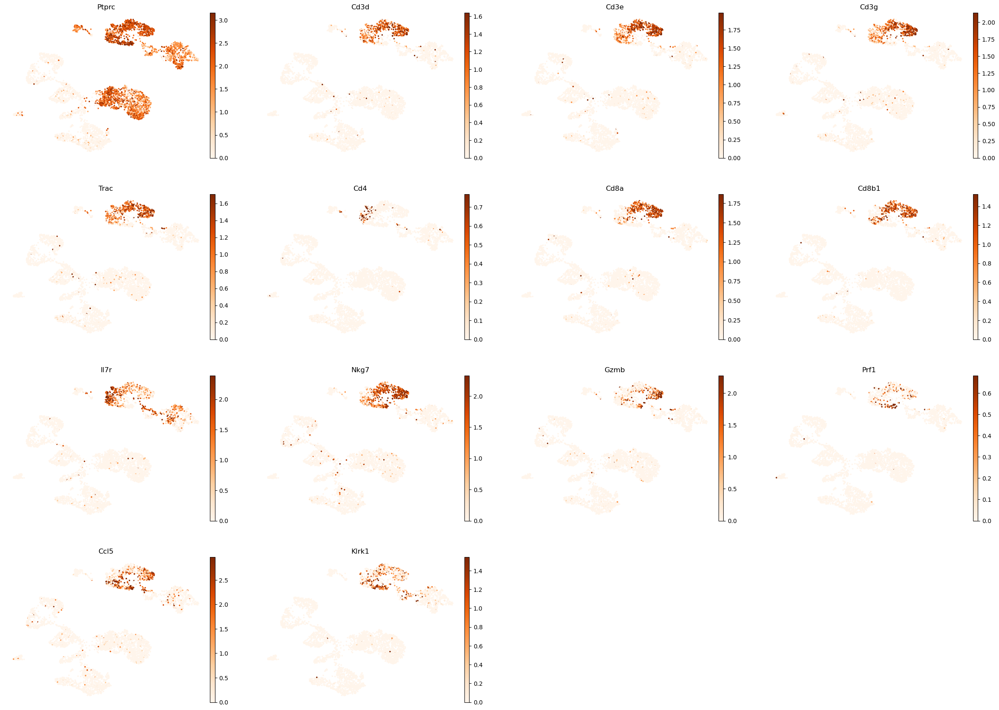





B_PLASMA_CELLS:


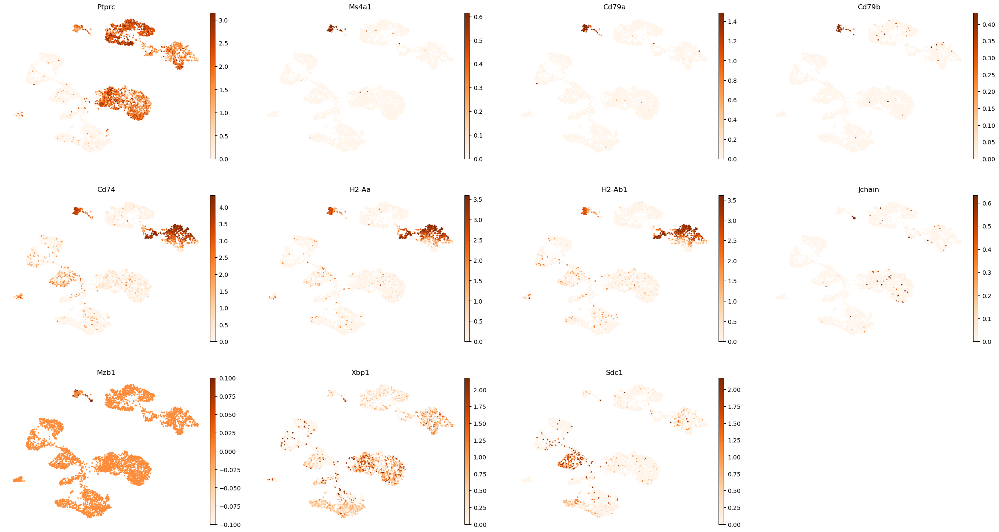





FIBROBLAST_PERICYTE_SMOOTH_MUSCLE:


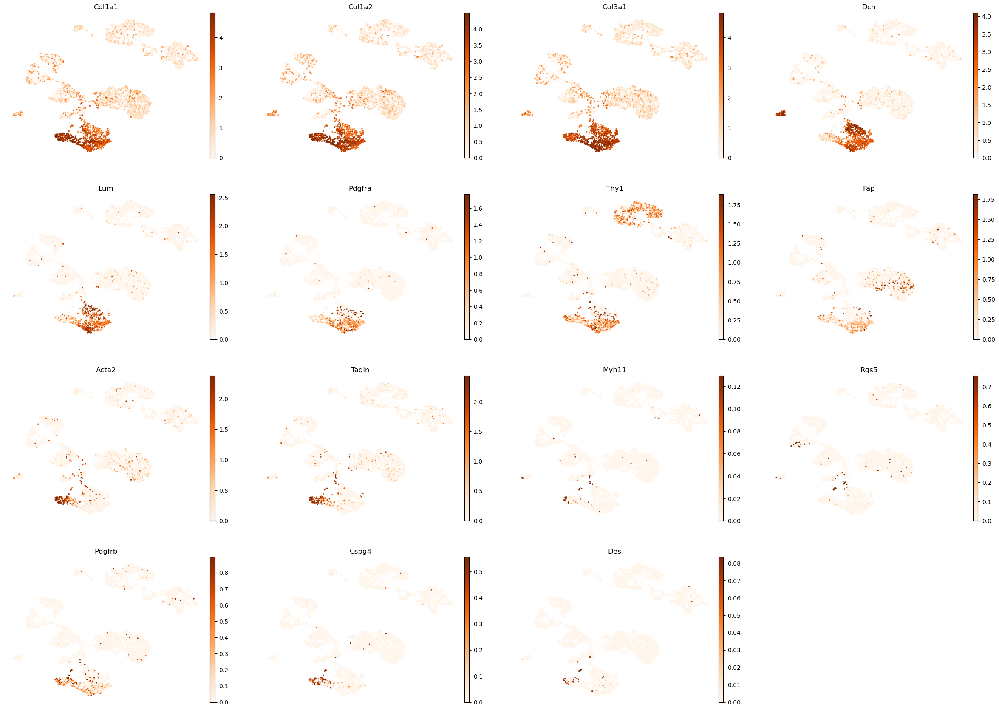





ENDOTHELIAL_LYMPHATIC:


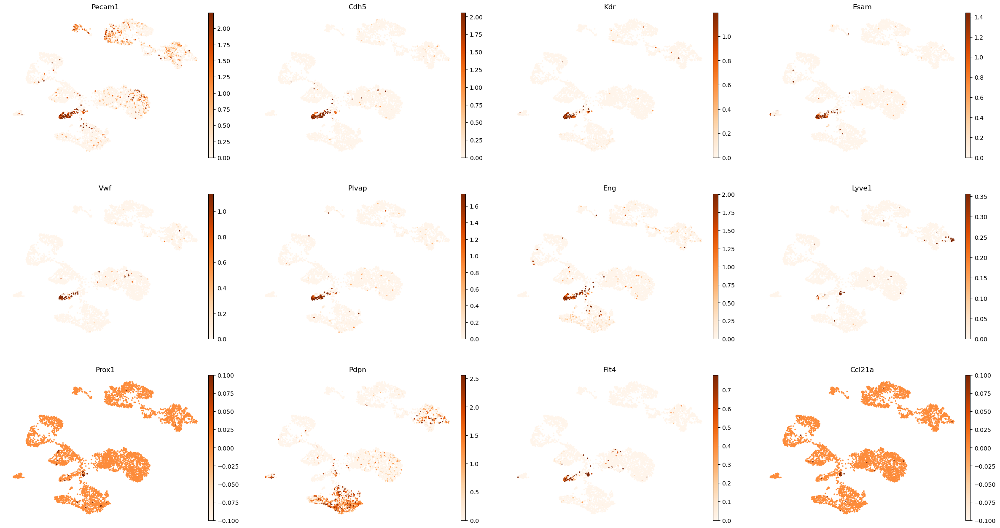





TAMS:


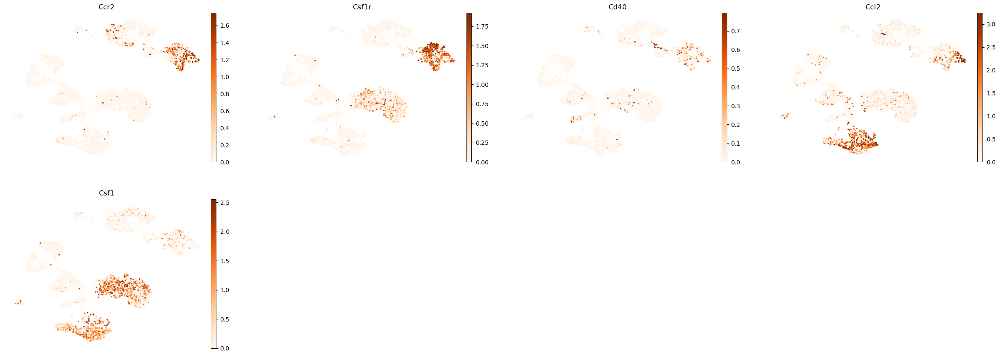

In [47]:
for ct, markers in markers_9_clusters.items():
    markers_found = []
    for marker in markers:
        if marker in adata.var.index:
            markers_found.append(marker)
    markers_9_clusters[ct] = markers_found

cluster_9_names = list(markers_9_clusters.keys())

for ct in cluster_9_names:
    print(f"{ct.upper()}:")  # print cell subtype name
    sc.pl.umap(
        adata,
        color=markers_9_clusters[ct],
        vmin=0,
        vmax="p99",  # set vmax to the 99th percentile of the gene count instead of the maximum, to prevent outliers from making expression in other cells invisible. Note that this can cause problems for extremely lowly expressed genes.
        sort_order=False,  # do not plot highest expression on top, to not get a biased view of the mean expression among cells
        frameon=False,
        cmap="Oranges",  # or choose another color map e.g. from here: https://matplotlib.org/stable/tutorials/colors/colormaps.html
    )
    print("\n\n\n")  # print white space for legibility

In [ ]:
sc.get.rank_genes_groups_df(adata, group="3").head(10)

,names,scores,logfoldchanges,pvals,pvals_adj
0,Gsto1,27.741037,8.479201,2.235137e-169,5.115335e-165
1,Psca,27.639145,9.121645,3.768889e-168,4.312739e-164
2,Krt13,26.621441,9.715865,3.833641e-156,2.924557e-152
3,Ppbp,25.678490,10.344279,2.032909e-145,1.163129e-141
4,Ltf,25.421225,8.557383,1.469357e-142,6.725540e-139
5,Nupr1,25.176174,7.033004,7.306760e-140,2.787042e-136
6,Ly6a,25.072540,4.652958,9.914985e-139,3.241633e-135
7,S100a11,24.188030,3.294923,2.973437e-129,8.506259e-126
8,Krt19,23.885199,6.123037,4.364760e-126,1.109910e-122
9,Malat1,22.890839,2.019586,5.732674e-116,1.311980e-112


In [ ]:
adata.obs["cell_type_lvl2"] = adata.obs["leiden_res_0.20"].map(
    {
        "0": "fibroblasts",
        "1": "tumor_basal_epithelial",
        "2": "macrophages",
        "3": "unknown",
        "4": "monocytes/neutrophils",
        "5": "t/nk cells",
        "6": "fibroblasts",
        "7": "tumor_luminal_epithelial",
        "8": "endothelial_lymphatic",
        "9": "b_plasma_cells",
    }
)

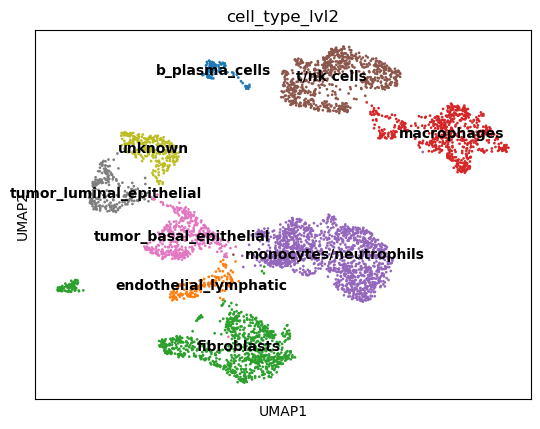

In [ ]:
sc.pl.umap(adata, color=["cell_type_lvl2"], legend_loc="on data", size=15)

KeyError: 'Could not find key Krt5 in .var_names or .obs.columns.'

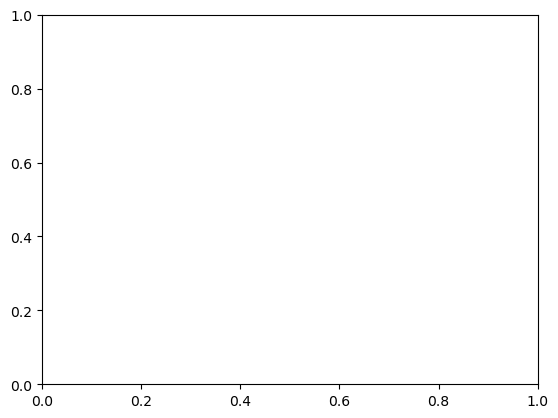

In [ ]:
sc.pl.umap(adata, color=["Krt5"], legend_loc="on data", size=9)